# SIAMESE-NETWORK-WITH-REPLAY-ATTACK

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
cd /content/drive/MyDrive/BTP/siamese-network-anti-spoofing

/content/drive/MyDrive/BTP/siamese-network-anti-spoofing


In [17]:
import os
import cv2
import zipfile
import random
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from datetime import datetime
from sklearn.utils import shuffle
from tensorflow import keras
import shutil
import dlib
import matplotlib.pyplot as plt
from imutils import face_utils
from google.colab.patches import cv2_imshow
from tensorflow.keras.applications.resnet50 import ResNet50

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [6]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [28]:
epochs = 75

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00006)
binary_cross_entropy = tf.keras.losses.BinaryCrossentropy()

# base_dir = "."
base_dir = "/content/drive/MyDrive/BTP/siamese-network-anti-spoofing"

stamp = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(base_dir, 'logs/func/%s' % stamp)
writer = tf.summary.create_file_writer(logdir)

scalar_logdir = os.path.join(base_dir, 'logs/scalars/%s' % stamp)
file_writer = tf.summary.create_file_writer(scalar_logdir + "/metrics")

checkpoint_path = os.path.join(base_dir, 'logs/model/siamese-network-anti-spoofing')

In [7]:
'''
The following code cell is taken from the source code of keras_vggface.
I tried using the preprocess_input function provided by tf.keras but they provide different results.
To my knowledge, it seems that the mean values which are subtracted in each image are different.
'''
K = tf.keras.backend

def preprocess_input(x, data_format=None, version=1):
    x_temp = np.copy(x)
    if data_format is None:
        data_format = K.image_data_format()
    assert data_format in {'channels_last', 'channels_first'}

    if version == 1:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 93.5940
            x_temp[:, 1, :, :] -= 104.7624
            x_temp[:, 2, :, :] -= 129.1863
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 93.5940
            x_temp[..., 1] -= 104.7624
            x_temp[..., 2] -= 129.1863

    elif version == 2:
        if data_format == 'channels_first':
            x_temp = x_temp[:, ::-1, ...]
            x_temp[:, 0, :, :] -= 91.4953
            x_temp[:, 1, :, :] -= 103.8827
            x_temp[:, 2, :, :] -= 131.0912
        else:
            x_temp = x_temp[..., ::-1]
            x_temp[..., 0] -= 91.4953
            x_temp[..., 1] -= 103.8827
            x_temp[..., 2] -= 131.0912
    else:
        raise NotImplementedError

    return x_temp

In [8]:
def curate_dataset(dataset_path):
        with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
            dataset = {}
            image_list = f.read().split()
            print('Total images: ',len(image_list))
            for image in image_list:
                folder_name, class_type ,file_name = image.split('/')
                if folder_name in dataset.keys():
                  if class_type in dataset[folder_name].keys():
                    dataset[folder_name][class_type].append(file_name)
                  else:
                    dataset[folder_name][class_type] = [file_name]
                else:
                    dataset[folder_name] = {class_type: [file_name]}
        return dataset

dataset = curate_dataset('./dataset/train')
print(dataset.keys()) 
print(len(dataset['client016']['spoof']))
print(len(dataset['client016']['real']))

Total images:  91705
dict_keys(['client016', 'client025', 'client108', 'client006', 'client027', 'client103', 'client004', 'client008', 'client018', 'client007', 'client012', 'client110', 'client002', 'client001', 'client105'])
4538
1500


In [9]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataset_path, batch_size=32, shuffle=True):
        self.dataset = self.curate_dataset(dataset_path)
        self.dataset_path = dataset_path
        self.shuffle = shuffle
        self.batch_size =batch_size
        self.no_of_people = len(list(self.dataset.keys()))
        self.on_epoch_end()
        
    def __getitem__(self, index):
        people = list(self.dataset.keys())[index * self.batch_size: (index + 1) * self.batch_size]
        P = []
        A = []
        N = []
        
        for person in people:
            anchor_index = random.randint(0, len(self.dataset[person]['real'])-1)
            a = self.get_image(person, 'real' ,anchor_index)
            
            positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            while positive_index == anchor_index:
                positive_index = random.randint(0, len(self.dataset[person]['real'])-1)
            p = self.get_image(person, 'real' ,positive_index)
            
            negative_index = random.randint(0, len(self.dataset[person]['spoof'])-1)
            n = self.get_image(person, 'spoof',negative_index)
            
            P.append(p)
            A.append(a)
            N.append(n)
            
        A = np.asarray(A)
        N = np.asarray(N)
        P = np.asarray(P)
        return [A, P, N]
        
    def __len__(self):
        return self.no_of_people // self.batch_size
        
    def curate_dataset(self,dataset_path):
        with open(os.path.join(dataset_path, 'list.txt'), 'r') as f:
            dataset = {}
            image_list = f.read().split()
            print('Total images: ',len(image_list))
            for image in image_list:
                folder_name, class_type ,file_name = image.split('/')
                if folder_name in dataset.keys():
                  if class_type in dataset[folder_name].keys():
                    dataset[folder_name][class_type].append(file_name)
                  else:
                    dataset[folder_name][class_type] = [file_name]
                else:
                    dataset[folder_name] = {class_type: [file_name]}
        return dataset
    
    def on_epoch_end(self):
        if self.shuffle:
            keys = list(self.dataset.keys())
            random.shuffle(keys)
            dataset_ =  {}
            for key in keys:
                dataset_[key] = self.dataset[key]
            self.dataset = dataset_
            
    def get_image(self, person, class_type, index):
        # print(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.imread(os.path.join(self.dataset_path, os.path.join('images/' + person+f'/{class_type}', self.dataset[person][class_type][index])))
        img = cv2.resize(img, (256, 256))
        img = np.asarray(img, dtype=np.float64)
        img = preprocess_input(img)
        return img

In [ ]:
# index = 4
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [10]:
vggface = tf.keras.models.Sequential()
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME", input_shape=(256,256, 3)))
vggface.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(128, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(256, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))
 
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.Convolution2D(512, (3, 3), activation='relu', padding="SAME"))
vggface.add(tf.keras.layers.MaxPooling2D((2,2), strides=(2,2)))

vggface.add(tf.keras.layers.Flatten())

vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(4096, activation='relu'))
vggface.add(tf.keras.layers.Dropout(0.5))
vggface.add(tf.keras.layers.Dense(2622, activation='softmax'))

In [ ]:
vggface.load_weights(os.path.join(base_dir, 'vgg_face_weights.h5'))

In [11]:
vggface.pop()
vggface.add(tf.keras.layers.Dense(128, use_bias=False))

for layer in vggface.layers[:-2]:
    layer.trainable = False

In [12]:
class SiameseNetwork(tf.keras.Model):
    def __init__(self, vgg_face):
        super(SiameseNetwork, self).__init__()
        self.vgg_face = vgg_face
        
    @tf.function
    def call(self, inputs):
        image_1, image_2, image_3 =  inputs
        with tf.name_scope("Anchor") as scope:
            feature_1 = self.vgg_face(image_1)
            feature_1 = tf.math.l2_normalize(feature_1, axis=-1)
        with tf.name_scope("Positive") as scope:
            feature_2 = self.vgg_face(image_2)
            feature_2 = tf.math.l2_normalize(feature_2, axis=-1)
        with tf.name_scope("Negative") as scope:
            feature_3 = self.vgg_face(image_3)
            feature_3 = tf.math.l2_normalize(feature_3, axis=-1)
        return [feature_1, feature_2, feature_3]
    
    @tf.function
    def get_features(self, inputs):
        return tf.math.l2_normalize(self.vgg_face(inputs), axis=-1)

In [13]:
model = SiameseNetwork(vggface)

In [14]:
def loss_function(x, alpha = 0.2):
    # Triplet Loss function.
    anchor,positive,negative = x
    # distance between the anchor and the positive
    pos_dist = K.sum(K.square(anchor-positive),axis=1)
    # distance between the anchor and the negative
    neg_dist = K.sum(K.square(anchor-negative),axis=1)
    # compute loss
    basic_loss = pos_dist-neg_dist+alpha
    loss = K.mean(K.maximum(basic_loss,0.0))
    return loss

In [15]:
def train(X):
    with tf.GradientTape() as tape:
        y_pred = model(X)
        loss = loss_function(y_pred)
    grad = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grad, model.trainable_variables))
    return loss

In [20]:
tf.summary.trace_on(graph=True, profiler=False)
output = model([tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3)), tf.zeros((32,256,256,3))])
with writer.as_default():
    tf.summary.trace_export(name="my_func_trace", step=0, profiler_outdir=logdir)
    
tf.summary.trace_off()

In [21]:
data_generator = DataGenerator(dataset_path='./dataset/train', batch_size=1)

Total images:  91705


In [ ]:
data_generator.get_image('client001','real',0)

./dataset/train/images/client001/real/client001_14490_real.png


array([[[  28.406 ,   26.2376,  -10.1863],
        [  28.406 ,   26.2376,   -9.1863],
        [  27.406 ,   26.2376,   -6.1863],
        ...,
        [ -88.594 , -101.7624, -124.1863],
        [ -85.594 , -104.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  29.406 ,   27.2376,  -10.1863],
        [  29.406 ,   27.2376,   -9.1863],
        [  28.406 ,   27.2376,   -6.1863],
        ...,
        [ -88.594 , -100.7624, -124.1863],
        [ -85.594 , -103.7624, -127.1863],
        [ -84.594 , -104.7624, -128.1863]],

       [[  32.406 ,   31.2376,  -11.1863],
        [  32.406 ,   31.2376,  -10.1863],
        [  32.406 ,   31.2376,   -6.1863],
        ...,
        [ -87.594 ,  -99.7624, -121.1863],
        [ -86.594 , -102.7624, -126.1863],
        [ -86.594 , -103.7624, -128.1863]],

       ...,

       [[  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -28.1863],
        [  27.406 ,   -5.7624,  -29.1863],
        ...,
        [ -92.594 , -104.7

In [ ]:
# data_curated = data_generator.curate_dataset(dataset_path='./dataset/train')
# print(len(data_curated['n000009']))

In [ ]:
print(data_generator[14])

[array([[[[141.406 ,  26.2376, -78.1863],
         [141.406 ,  26.2376, -78.1863],
         [141.406 ,  26.2376, -78.1863],
         ...,
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863]],

        [[141.406 ,  26.2376, -78.1863],
         [141.406 ,  26.2376, -78.1863],
         [141.406 ,  26.2376, -78.1863],
         ...,
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863]],

        [[142.406 ,  28.2376, -76.1863],
         [142.406 ,  27.2376, -77.1863],
         [142.406 ,  27.2376, -77.1863],
         ...,
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863],
         [144.406 ,  55.2376, -55.1863]],

        ...,

        [[131.406 ,  20.2376, -80.1863],
         [131.406 ,  20.2376, -80.1863],
         [130.406 ,  19.2376, -81.1863],
         ...,
         [144.406 ,  39.2376, -67.1863],
         [144.406 ,  

In [22]:
a, p, n = data_generator[0]

In [ ]:
# index = 1
# cv2.imshow("Positive", p[index])
# cv2.imshow("Negative", n[index])
# cv2.imshow("Anchor", a[index])
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/pixel-wise-supervision-siamese-network/logs/
# %tensorboard --logdir ./logs/

<IPython.core.display.Javascript object>

In [23]:
checkpoint = tf.train.Checkpoint(model=model)

In [ ]:
losses = []
accuracy = []

no_of_batches = data_generator.__len__()
for i in range(1, epochs+1, 1):
    loss = 0
    with tqdm(total=no_of_batches) as pbar:
        
        description = "Epoch " + str(i) + "/" + str(epochs)
        pbar.set_description_str(description)
        
        for j in range(no_of_batches):
            data = data_generator[j]
            temp = train(data)
            loss += temp
            
            pbar.update()
            print_statement = "Loss :" + str(temp.numpy())
            pbar.set_postfix_str(print_statement)
        
        loss /= no_of_batches
        losses.append(loss.numpy())
        with file_writer.as_default():
            tf.summary.scalar('Loss', data=loss.numpy(), step=i)
            
        print_statement = "Loss :" + str(loss.numpy())
        
        pbar.set_postfix_str(print_statement)

checkpoint.save(checkpoint_path)
print("Checkpoint Saved")

Epoch 75/75: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :0.0]


Checkpoint Saved


In [ ]:
temp = ['Epoch 1/75: 100%|██████████| 15/15 [00:17<00:00,  1.17s/it, Loss :0.1698429]\n',
'Epoch 2/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.12831871]\n',
'Epoch 3/75: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :0.005115362]\n',
'Epoch 4/75: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :0.03788174]\n',
'Epoch 5/75: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :0.01714023]\n',
'Epoch 6/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.053416837]\n',
'Epoch 7/75: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :0.003162394]\n',
'Epoch 8/75: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it, Loss :0.026150707]\n',
'Epoch 9/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.0010137071]\n',
'Epoch 10/75: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :0.0]\n',
'Epoch 11/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.03550657]\n',
'Epoch 12/75: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :0.014954004]\n',
'Epoch 13/75: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :0.013202846]\n',
'Epoch 14/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0034062166]\n',
'Epoch 15/75: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :0.011503375]\n',
'Epoch 16/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.0]\n',
'Epoch 17/75: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it, Loss :0.0]\n',
'Epoch 18/75: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :0.020870762]\n',
'Epoch 19/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.03244527]\n',
'Epoch 20/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.0]\n',
'Epoch 21/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.026823426]\n',
'Epoch 22/75: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :0.017552694]\n',
'Epoch 23/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.0]\n',
'Epoch 24/75: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :0.0041380883]\n',
'Epoch 25/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.0044011255]\n',
'Epoch 26/75: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :0.057075635]\n',
'Epoch 27/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.03293666]\n',
'Epoch 28/75: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :0.013802313]\n',
'Epoch 29/75: 100%|██████████| 15/15 [00:15<00:00,  1.00s/it, Loss :0.010527968]\n',
'Epoch 30/75: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it, Loss :0.008083034]\n',
'Epoch 31/75: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :0.0]\n',
'Epoch 32/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0]\n',
'Epoch 33/75: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :0.0]\n',
'Epoch 34/75: 100%|██████████| 15/15 [00:15<00:00,  1.04s/it, Loss :0.0056088446]\n',
'Epoch 35/75: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :0.019390304]\n',
'Epoch 36/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.004641062]\n',
'Epoch 37/75: 100%|██████████| 15/15 [00:15<00:00,  1.01s/it, Loss :0.0060032555]\n',
'Epoch 38/75: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :0.0]\n',
'Epoch 39/75: 100%|██████████| 15/15 [00:15<00:00,  1.05s/it, Loss :0.0]\n',
'Epoch 40/75: 100%|██████████| 15/15 [00:16<00:00,  1.08s/it, Loss :0.0013033419]\n',
'Epoch 41/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.00012708406]\n',
'Epoch 42/75: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :0.0]\n',
'Epoch 43/75: 100%|██████████| 15/15 [00:15<00:00,  1.00s/it, Loss :0.0]\n',
'Epoch 44/75: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s, Loss :0.0091156345]\n',
'Epoch 45/75: 100%|██████████| 15/15 [00:16<00:00,  1.09s/it, Loss :0.0]\n',
'Epoch 46/75: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :0.0]\n',
'Epoch 47/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.0]\n',
'Epoch 48/75: 100%|██████████| 15/15 [00:14<00:00,  1.00it/s, Loss :0.0]\n',
'Epoch 49/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.0045264293]\n',
'Epoch 50/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.044141617]\n',
'Epoch 51/75: 100%|██████████| 15/15 [00:14<00:00,  1.05it/s, Loss :0.013219008]\n',
'Epoch 52/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.012450378]\n',
'Epoch 53/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.017644254]\n',
'Epoch 54/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0036365201]\n',
'Epoch 55/75: 100%|██████████| 15/15 [00:14<00:00,  1.01it/s, Loss :0.008642477]\n',
'Epoch 56/75: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :0.0027863046]\n',
'Epoch 57/75: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :0.0]\n',
'Epoch 58/75: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it, Loss :0.0]\n',
'Epoch 59/75: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :0.015795205]\n',
'Epoch 60/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0]\n',
'Epoch 61/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.0125098815]\n',
'Epoch 62/75: 100%|██████████| 15/15 [00:13<00:00,  1.09it/s, Loss :0.0081197955]\n',
'Epoch 63/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0]\n',
'Epoch 64/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.011456907]\n',
'Epoch 65/75: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s, Loss :0.0]\n',
'Epoch 66/75: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s, Loss :0.0]\n',
'Epoch 67/75: 100%|██████████| 15/15 [00:13<00:00,  1.10it/s, Loss :0.005767658]\n',
'Epoch 68/75: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s, Loss :0.0]\n',
'Epoch 69/75: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it, Loss :0.00011428396]\n',
'Epoch 70/75: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s, Loss :0.018807057]\n',
'Epoch 71/75: 100%|██████████| 15/15 [00:16<00:00,  1.10s/it, Loss :0.011160767]\n',
'Epoch 72/75: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s, Loss :0.012931633]\n',
'Epoch 73/75: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it, Loss :0.008685232]\n',
'Epoch 74/75: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s, Loss :0.0]\n',
'Epoch 75/75: 100%|██████████| 15/15 [00:13<00:00,  1.14it/s, Loss :0.0]\n',
''];


splits = []
for x in temp:
  if 'Loss :' in x:
    val = x.split('Loss :')
    for t in val:
      if ']' in t:
        s = t.split(']')
        m = s[0]
        splits.append(float(m))

all_loss = splits
all_epochs = [i for i in range(len(all_loss))]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]


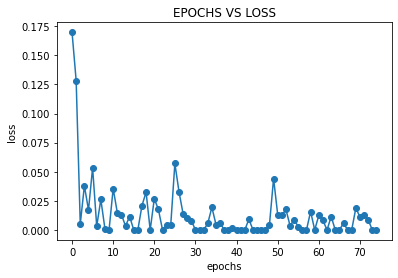

In [ ]:
# GRAPH FOR LOSS VS EPOCH
plt.plot(all_epochs,all_loss,marker='o')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.title('EPOCHS VS LOSS')
plt.show()

### PREDICTION

In [24]:
if os.path.isdir('dataset/test'):
  # shutil.rmtree('dataset/test')
  pass
else:
  # !unzip dataset/images.zip -d dataset/
  with zipfile.ZipFile('dataset/test.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset/')


In [25]:
test_data_multiple_dir = './dataset/test/images/multiple/' 
features = []

In [26]:
people = sorted(os.listdir(test_data_multiple_dir))
face_detector = dlib.get_frontal_face_detector()
features = []
dumpable_features = {}

In [29]:
model = SiameseNetwork(vggface)
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.restore(checkpoint_path)

In [30]:
for person in people:
    person_path = os.path.join(test_data_multiple_dir, person)
    print(person_path)
    images = []
    for image in os.listdir(person_path):
        image_path = os.path.join(person_path, image)
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_detector(gray, 0)
        if len(faces) == 1:
            for face in faces:
                face_bounding_box = face_utils.rect_to_bb(face)
                if all(i >= 0 for i in face_bounding_box):
                    [x, y, w, h] = face_bounding_box
                    frame = img[y:y + h, x:x + w]
                    frame = cv2.resize(frame, (256, 256))
                    frame = np.asarray(frame, dtype=np.float64)
                    images.append(frame)
    images = np.asarray(images)
    images = preprocess_input(images)
    images = tf.convert_to_tensor(images)
    feature = model.get_features(images)
    feature = tf.reduce_mean(feature, axis=0)
    features.append(feature.numpy())
    dumpable_features[person] = feature.numpy()

./dataset/test/images/multiple/client_009
./dataset/test/images/multiple/client_011
./dataset/test/images/multiple/client_019
./dataset/test/images/multiple/client_102
./dataset/test/images/multiple/client_117


In [35]:
features = np.asarray(features)
features[0]

array([-0.07516515,  0.04143633, -0.09756584,  0.04660041,  0.01517861,
        0.01124957,  0.12605727,  0.08015127,  0.04897418, -0.0384789 ,
        0.10192499,  0.06368751,  0.01732502, -0.13511267, -0.06838789,
        0.10247527,  0.03727482,  0.03234186, -0.1902    , -0.08320877,
        0.00485102,  0.06134007,  0.11901524,  0.0307757 , -0.0680175 ,
       -0.0737763 , -0.03600749,  0.0175048 ,  0.10676014,  0.01183477,
        0.13058811,  0.01635767,  0.11323366,  0.06558815,  0.14828609,
        0.04264449,  0.02923966, -0.00081752, -0.13923356,  0.00939593,
       -0.0445651 , -0.09895144,  0.15113744, -0.0250794 , -0.01634313,
       -0.03820492, -0.13940802, -0.00837104,  0.02551774, -0.08507945,
        0.03750142, -0.00678012, -0.02425524, -0.07223073, -0.06149334,
       -0.09348893,  0.09592725, -0.00863153, -0.00552778,  0.12453918,
        0.14475107, -0.06919675, -0.01355802, -0.10695754, -0.15227464,
        0.15077731, -0.05762408,  0.19170713, -0.0838549 ,  0.19

In [ ]:
print(people)

['client_009', 'client_011', 'client_019', 'client_102', 'client_117']


In [36]:
def is_image_recognized(path):
  name = 'SPOOF'
  img = cv2.imread(path)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  faces = face_detector(gray, 0)
  for face in faces:
      face_bounding_box = face_utils.rect_to_bb(face)
      if all(i >= 0 for i in face_bounding_box):
          [x, y, w, h] = face_bounding_box
          frame = img[y:y + h, x:x + w]
          cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
          frame = cv2.resize(frame, (256, 256))
          frame = np.asarray(frame, dtype=np.float64)
          frame = np.expand_dims(frame, axis=0)
          frame = preprocess_input(frame)
          feature = model.get_features(frame)
          print('feature of single test image is : ',feature)
          print('difference:', features - feature)   
          dist = tf.norm(features - feature, axis=1)
          print('dist',dist)
          name = 'SPOOF'
          loc = tf.argmin(dist)
          if dist[loc] < 0.8:
              name = f'{people[loc]}-REAL--{dist[loc]}'
          else:
              # print(dist.numpy())
              name = f'{people[loc]}-SPOOF--{dist[loc]}'
                  
          font_face = cv2.FONT_HERSHEY_SIMPLEX
          cv2.putText(img, name, (x, y-5), font_face, 0.8, (0,0,255), 3)
  cv2_imshow(img)
  return True

feature of single test image is :  tf.Tensor(
[[-7.53450766e-02  9.02204439e-02 -1.39504969e-01  9.25893337e-02
   2.47678030e-02  1.73296817e-02  1.30526528e-01  8.37132856e-02
   3.92667539e-02 -4.30668257e-02  1.10140979e-01  3.38217355e-02
   4.28151432e-03 -2.34829232e-01 -8.06567073e-02  8.80502462e-02
   6.63708448e-02 -2.03774148e-03 -2.32603669e-01 -1.23344615e-01
   2.54199468e-02  1.06875010e-01  1.10685766e-01  4.60178368e-02
  -5.30637205e-02 -5.89978546e-02 -5.08362800e-02  5.40119819e-02
   1.09101593e-01  2.43792813e-02  8.42626244e-02 -2.36739293e-02
   1.07673064e-01  7.88152441e-02  1.26145780e-01  1.41425319e-02
   2.57213935e-02  1.38515318e-02 -1.45743385e-01 -3.30130965e-03
   3.64245027e-02 -5.94650246e-02  2.04594374e-01  3.09936404e-02
   2.31828298e-02 -9.44529623e-02 -9.11672562e-02 -1.27613870e-02
   2.90235970e-02 -1.16821796e-01  6.99590659e-03  7.53633119e-03
  -2.64771469e-02 -4.35726568e-02 -3.86830233e-02 -5.94824292e-02
   8.05133358e-02  1.29719814e

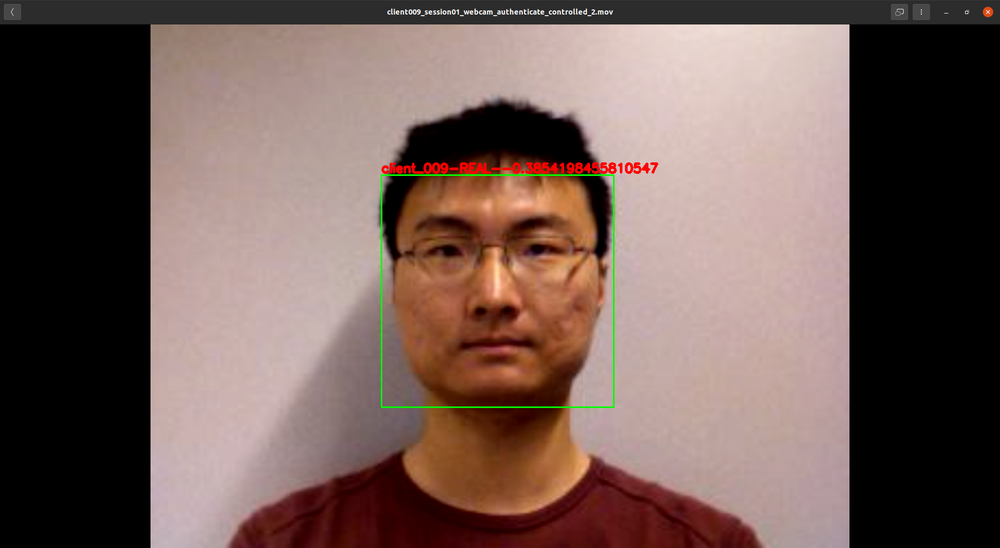

True


In [37]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_real.png')
print(is_rec)

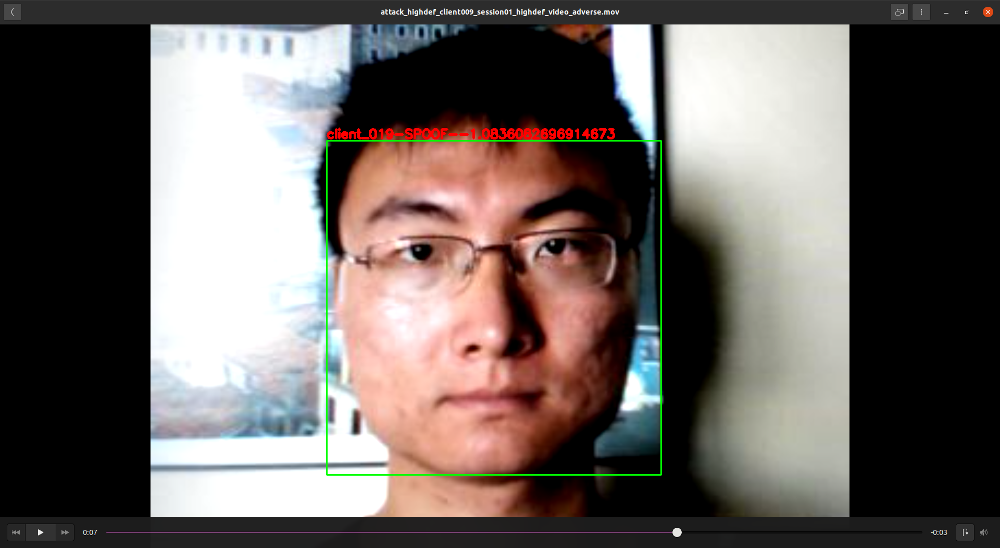

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_009_spoof.png')
print(is_rec)

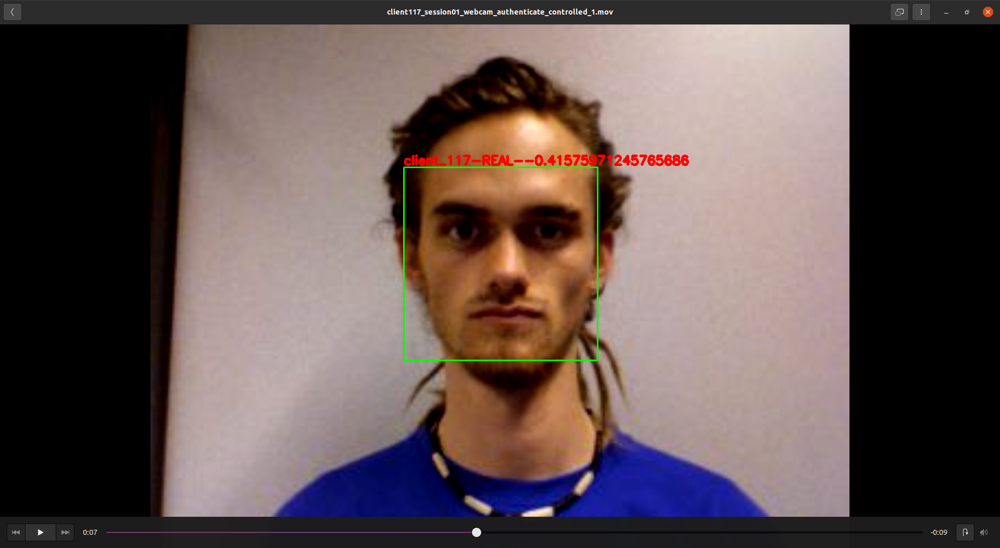

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_real.png')
print(is_rec)

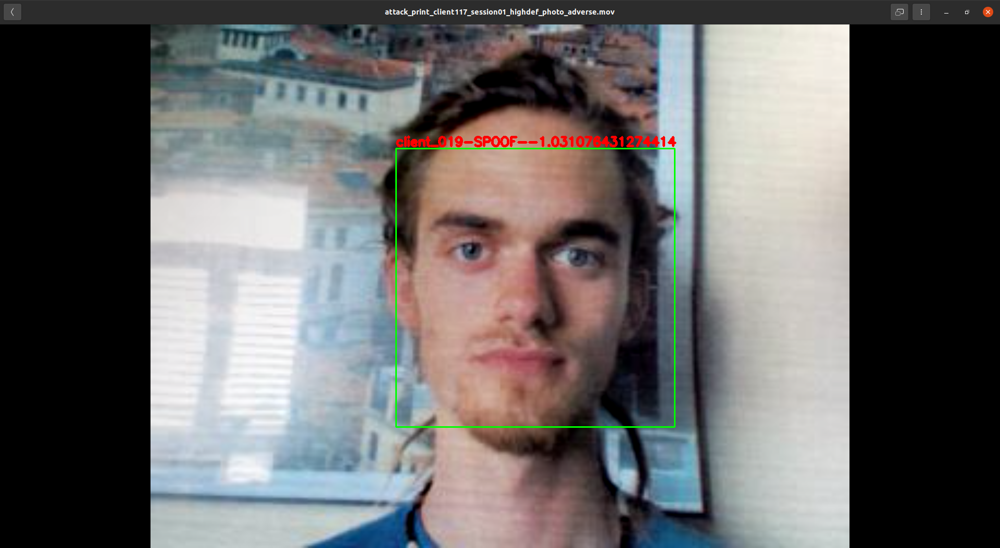

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_117_spoof.png')
print(is_rec)

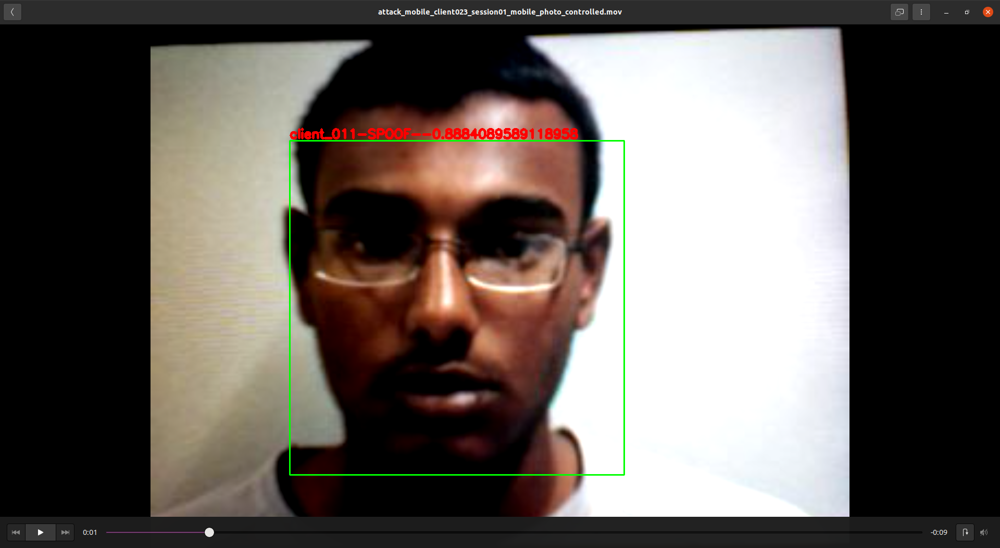

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_attack.png')
print(is_rec)

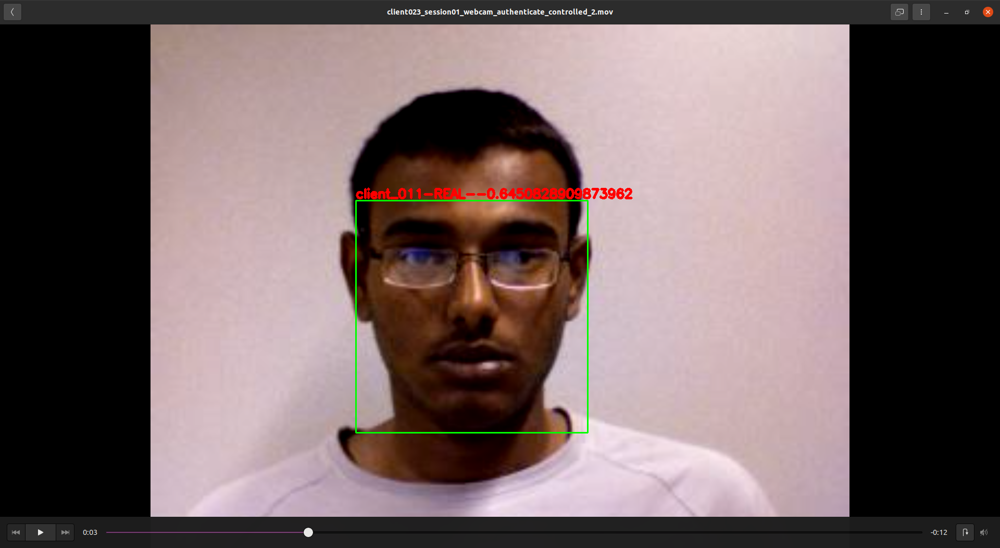

True


In [ ]:
is_rec = is_image_recognized('./dataset/test/images/single/client_023_404_real.png')
print(is_rec)